In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

from warnings import filterwarnings
filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler , PowerTransformer

import scipy.stats as stats

import statsmodels.api as sm

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression

from sklearn.naive_bayes import GaussianNB

from sklearn.svm import SVC

from sklearn import tree

from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score,roc_auc_score,roc_curve,f1_score,precision_score,recall_score,classification_report

from sklearn.metrics import cohen_kappa_score,confusion_matrix

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,StackingClassifier

from xgboost import XGBClassifier

from sklearn.model_selection import GridSearchCV

from sklearn.feature_selection import RFE

In [30]:
df= pd.read_csv('data.csv')
df.head(5)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Purchase
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [31]:
## Basic analysis of data set

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [32]:
df.dtypes

Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Purchase                      bool
dtype: object

In [33]:
df.shape

(12330, 18)

In [34]:
df.size

221940

In [35]:
df.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Purchase                   0
dtype: int64

In [36]:
num_col= df.select_dtypes(include= 'number').columns.to_list()
num_col

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType']

In [37]:
cat_col = df.select_dtypes(exclude= 'number').columns.to_list()
cat_col

['Month', 'VisitorType', 'Weekend', 'Purchase']

Inferences

1. There are 12280 rows and 18 columns including the target variable
2. 14 numerical column and 4 category column
3. There is no missing value.

In [38]:
df[num_col].describe().T

,count,mean,std,min,25%,50%,75%,max
Administrative,12330.0,2.315166,3.321784,0.0,0.000000,1.000000,4.000000,27.000000
Administrative_Duration,12330.0,80.818611,176.779107,0.0,0.000000,7.500000,93.256250,3398.750000
Informational,12330.0,0.503569,1.270156,0.0,0.000000,0.000000,0.000000,24.000000
Informational_Duration,12330.0,34.472398,140.749294,0.0,0.000000,0.000000,0.000000,2549.375000
ProductRelated,12330.0,31.731468,44.475503,0.0,7.000000,18.000000,38.000000,705.000000
ProductRelated_Duration,12330.0,1194.746220,1913.669288,0.0,184.137500,598.936905,1464.157214,63973.522230
BounceRates,12330.0,0.022191,0.048488,0.0,0.000000,0.003112,0.016813,0.200000
ExitRates,12330.0,0.043073,0.048597,0.0,0.014286,0.025156,0.050000,0.200000
PageValues,12330.0,5.889258,18.568437,0.0,0.000000,0.000000,0.000000,361.763742
SpecialDay,12330.0,0.061427,0.198917,0.0,0.000000,0.000000,0.000000,1.000000


In [39]:
for i in cat_col:
    print(df[i].value_counts)

<bound method IndexOpsMixin.value_counts of 0        Feb
1        Feb
2        Feb
3        Feb
4        Feb
        ... 
12325    Dec
12326    Nov
12327    Nov
12328    Nov
12329    Nov
Name: Month, Length: 12330, dtype: object>
<bound method IndexOpsMixin.value_counts of 0        Returning_Visitor
1        Returning_Visitor
2        Returning_Visitor
3        Returning_Visitor
4        Returning_Visitor
               ...        
12325    Returning_Visitor
12326    Returning_Visitor
12327    Returning_Visitor
12328    Returning_Visitor
12329          New_Visitor
Name: VisitorType, Length: 12330, dtype: object>
<bound method IndexOpsMixin.value_counts of 0        False
1        False
2        False
3        False
4         True
         ...  
12325     True
12326     True
12327     True
12328    False
12329     True
Name: Weekend, Length: 12330, dtype: bool>
<bound method IndexOpsMixin.value_counts of 0        False
1        False
2        False
3        False
4        False
         

In [40]:
['Month', 'VisitorType', 'Weekend', 'Purchase']

['Month', 'VisitorType', 'Weekend', 'Purchase']

In [41]:
df['Month'].value_counts(normalize=True)

Month
May     0.272830
Nov     0.243147
Mar     0.154663
Dec     0.140065
Oct     0.044526
Sep     0.036334
Aug     0.035118
Jul     0.035036
June    0.023358
Feb     0.014923
Name: proportion, dtype: float64

In [42]:
df['VisitorType'].value_counts(normalize=True)

VisitorType
Returning_Visitor    0.855718
New_Visitor          0.137388
Other                0.006894
Name: proportion, dtype: float64

In [43]:
df['Weekend'].value_counts(normalize=True)

Weekend
False    0.767397
True     0.232603
Name: proportion, dtype: float64

In [44]:
df['Purchase'].value_counts(normalize=True)

Purchase
False    0.845255
True     0.154745
Name: proportion, dtype: float64

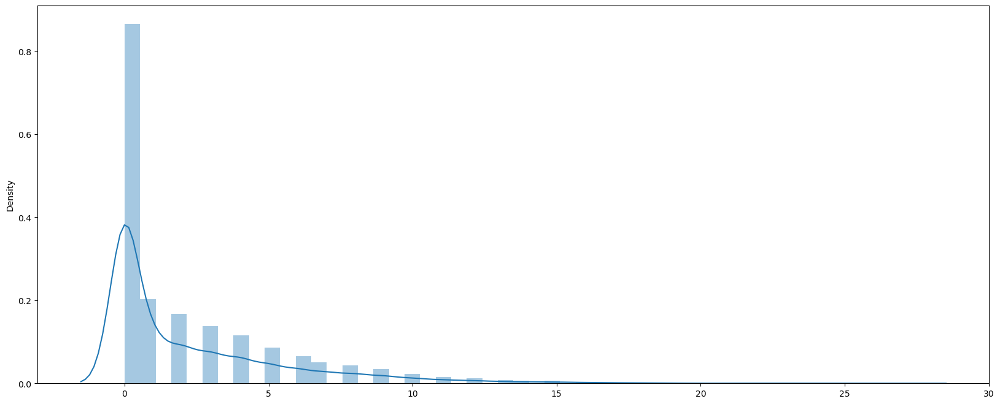

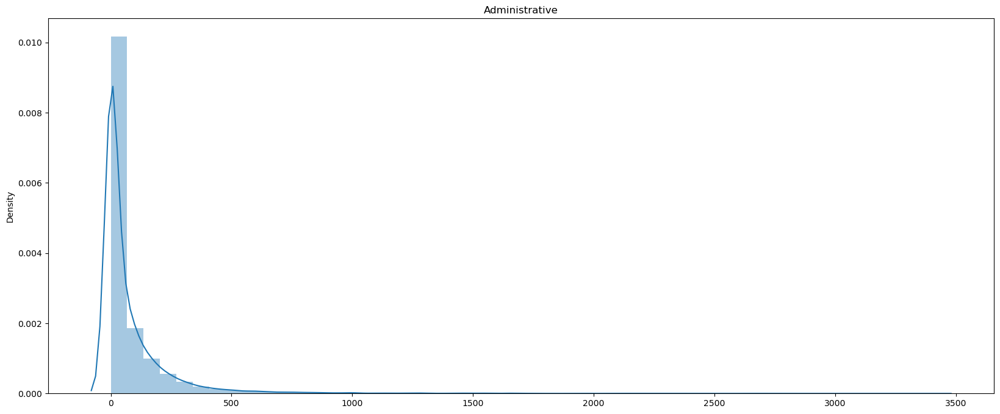

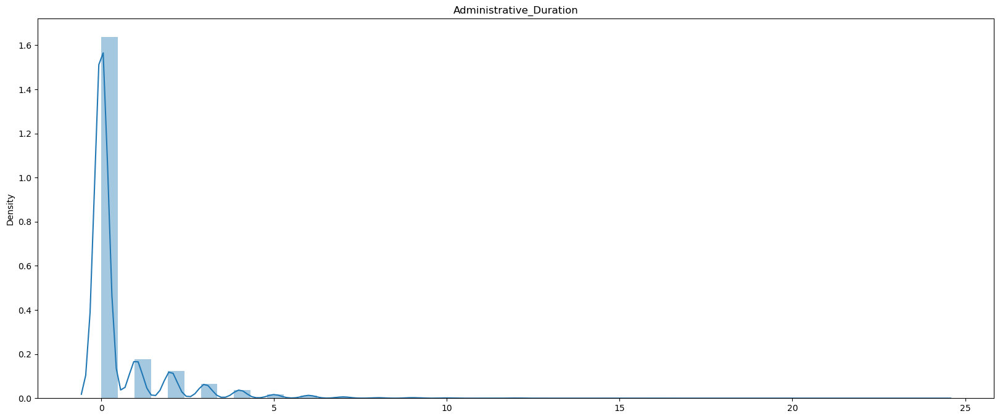

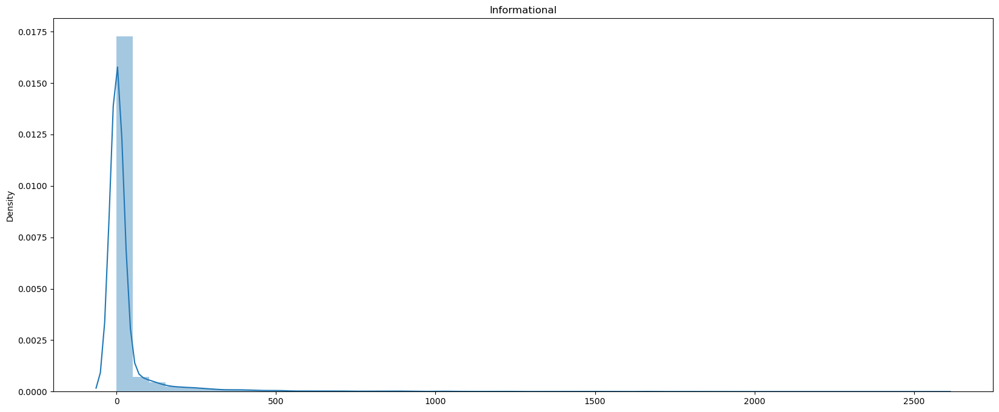

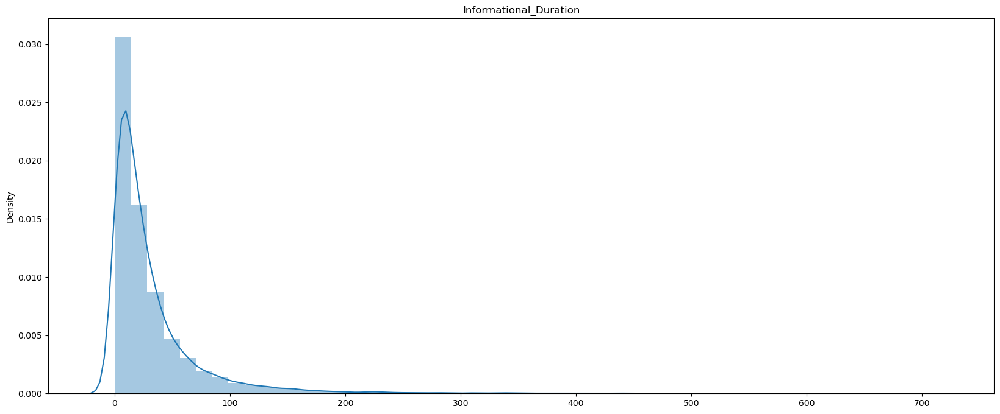

...

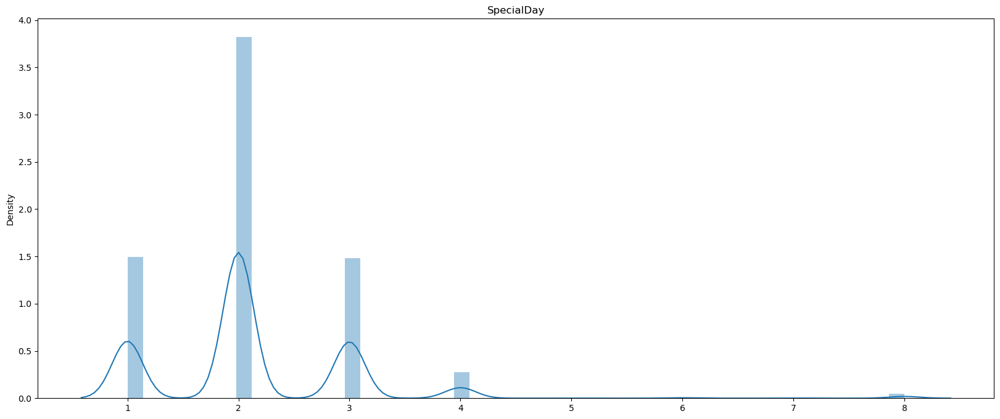

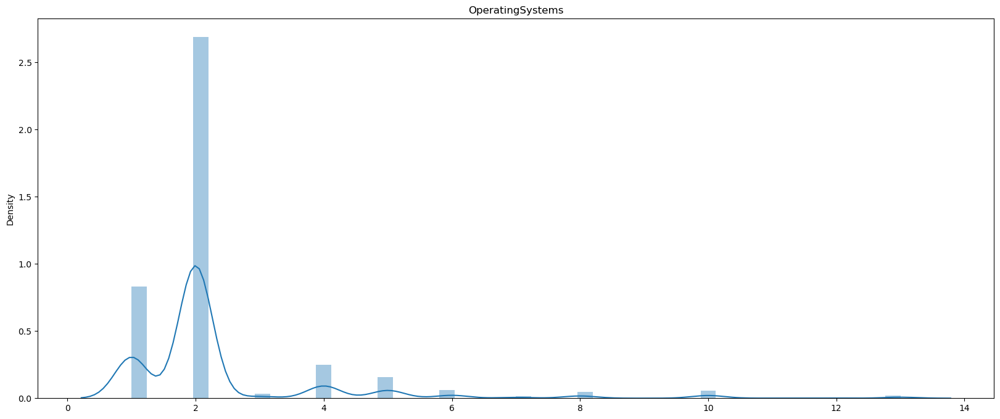

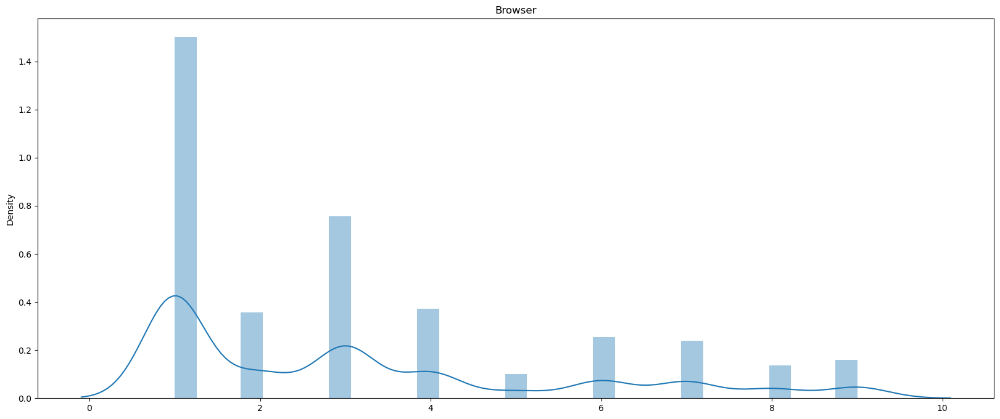

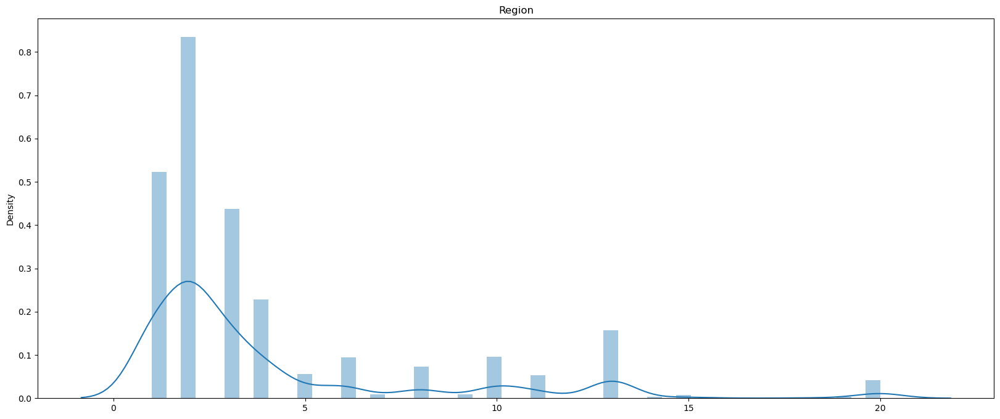

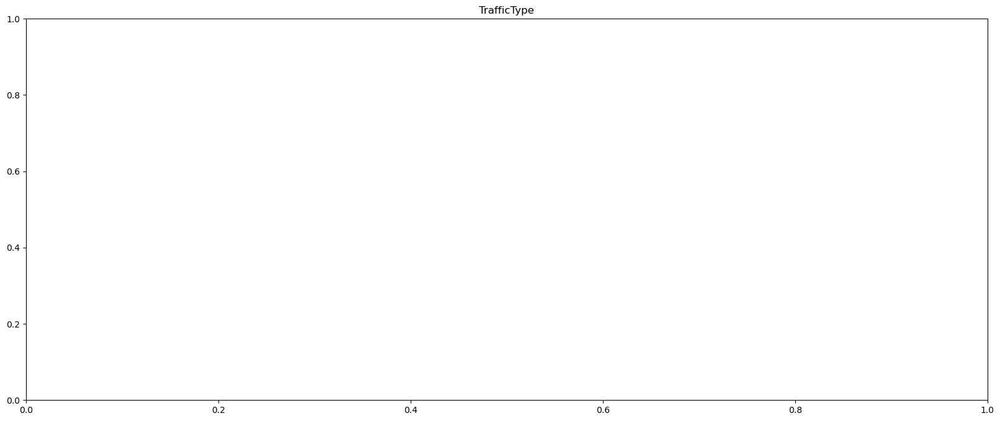

In [45]:
## perorming univariant analysis

for i in num_col:
    sns.distplot(x= df[i])
    plt.show()
    plt.title(i)

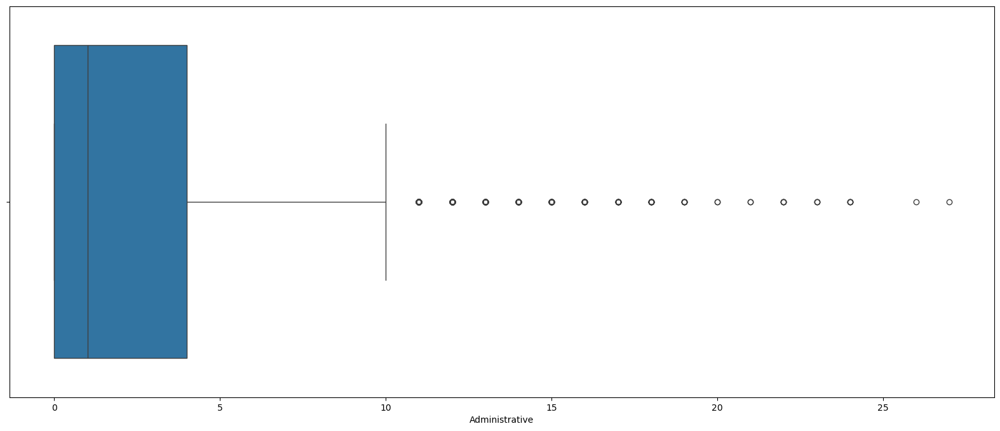

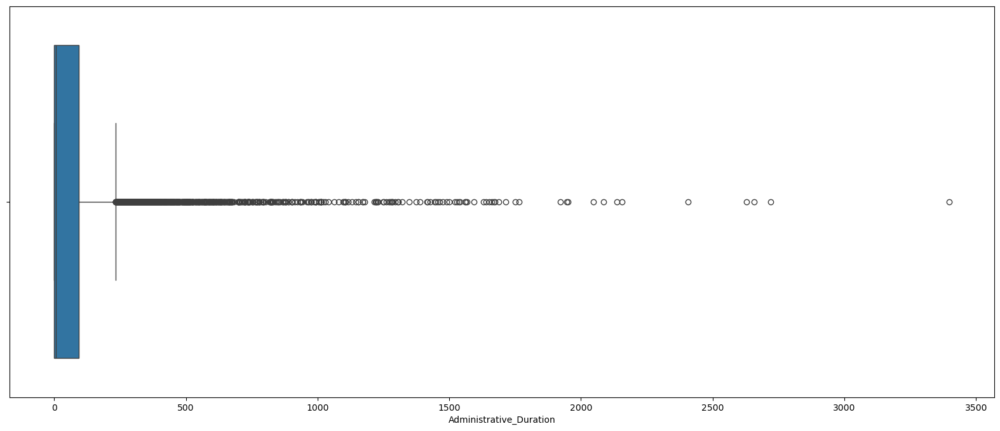

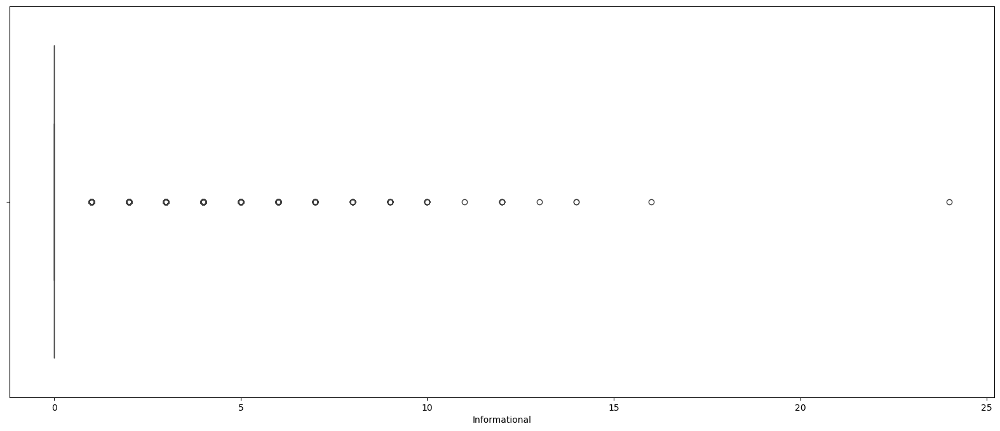

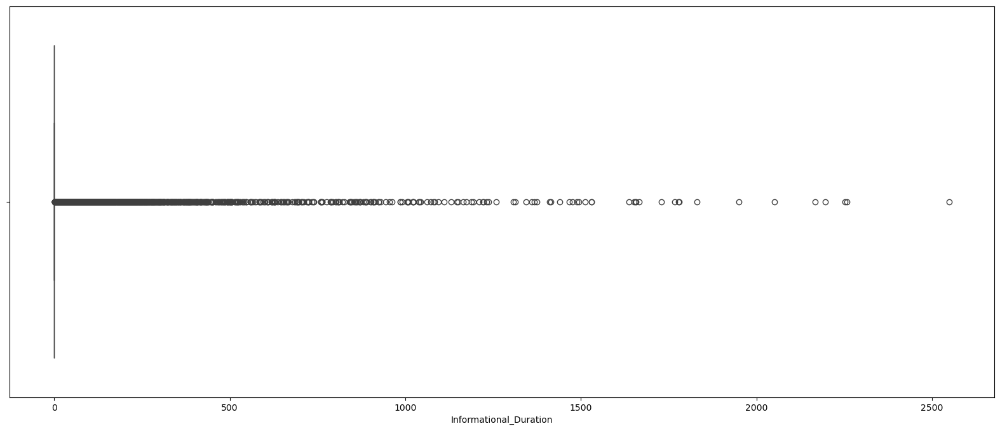

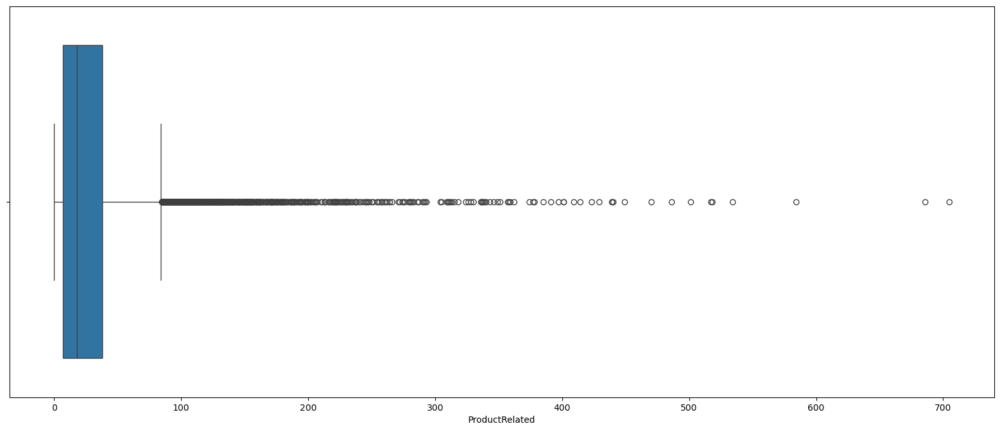

...

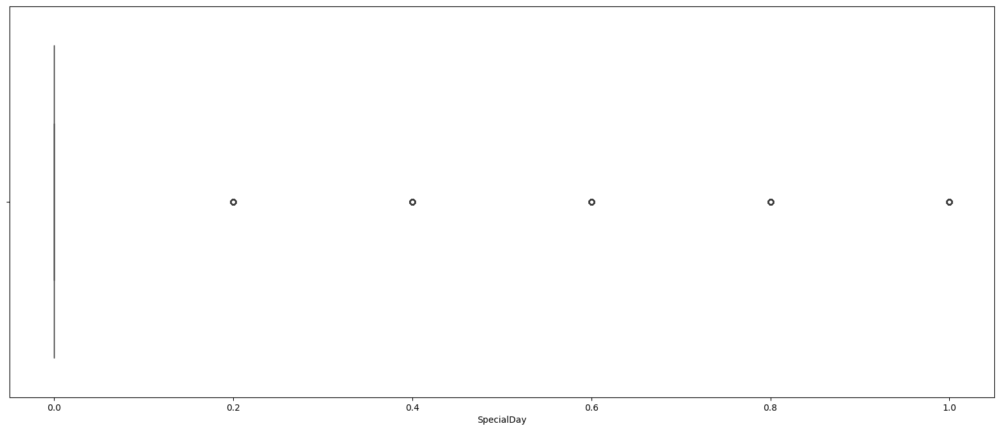

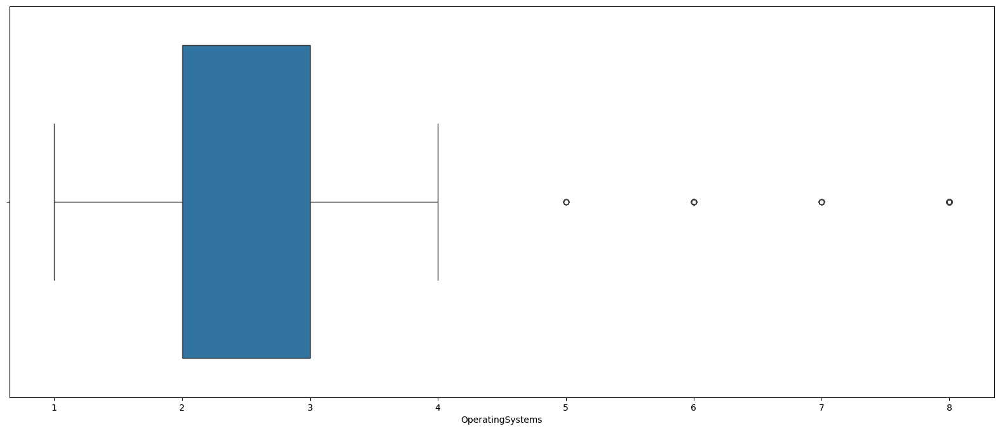

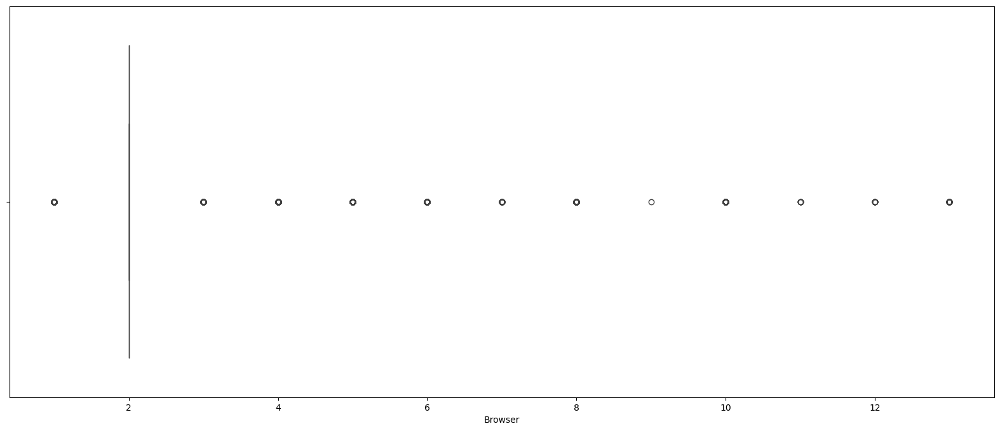

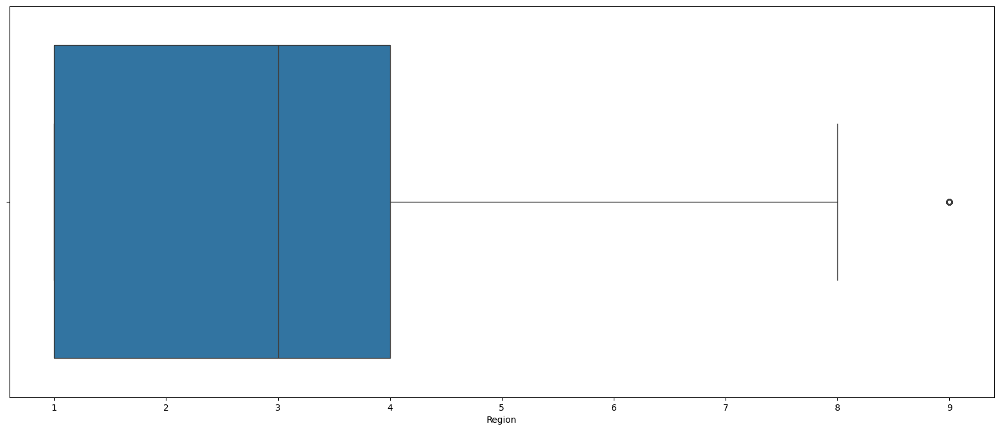

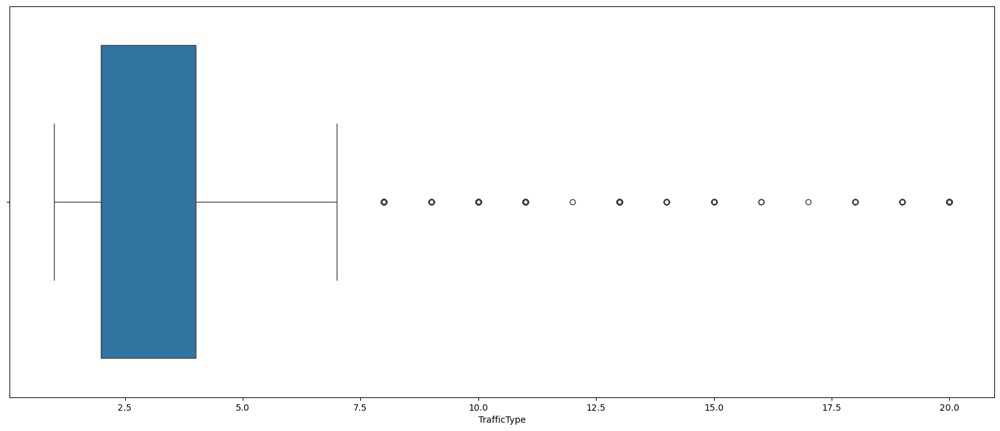

In [46]:
for i in num_col:
    sns.boxplot(x=df[i])
    plt.show()

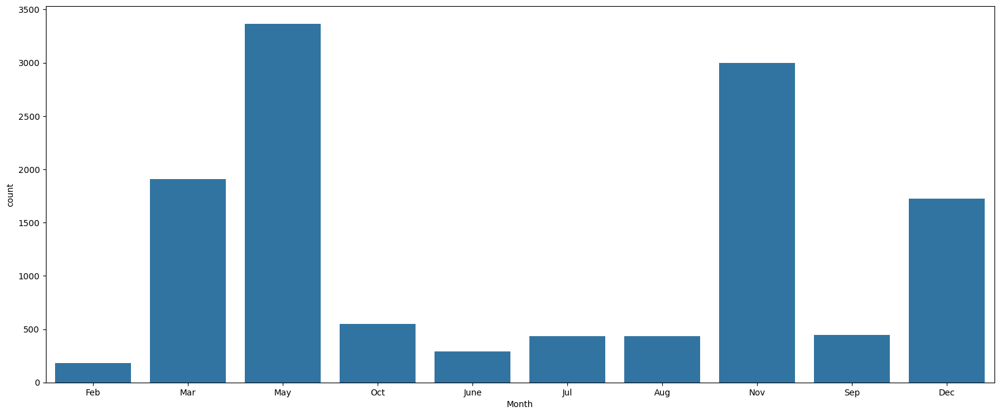

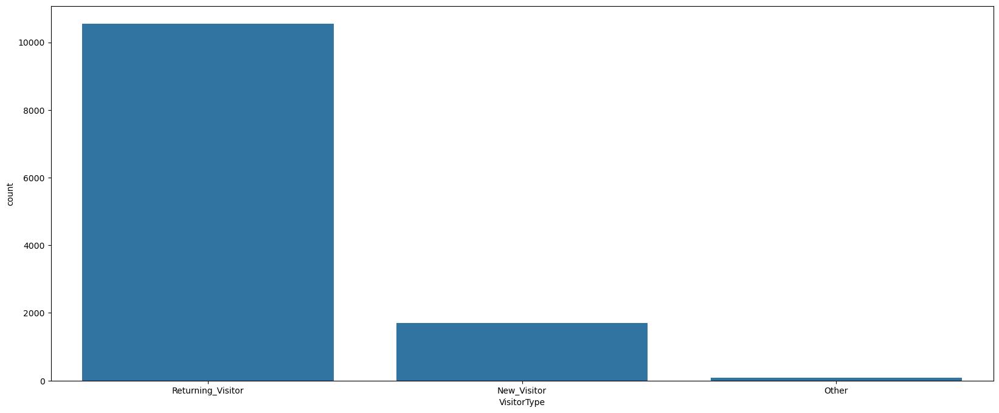

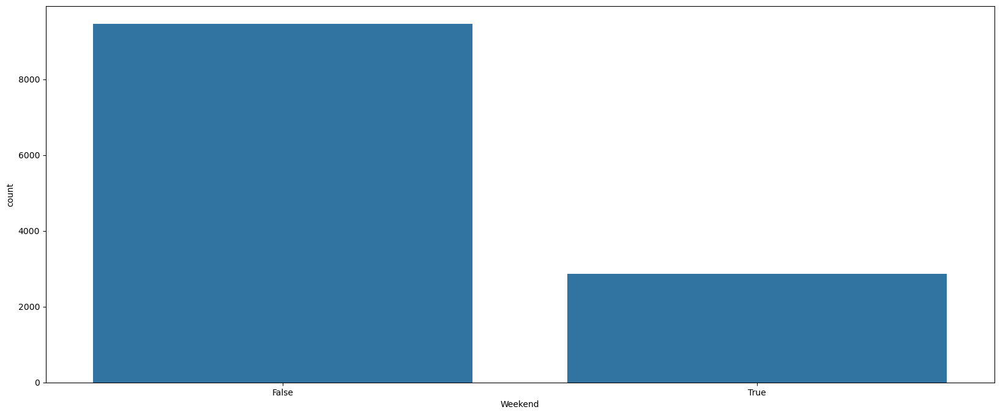

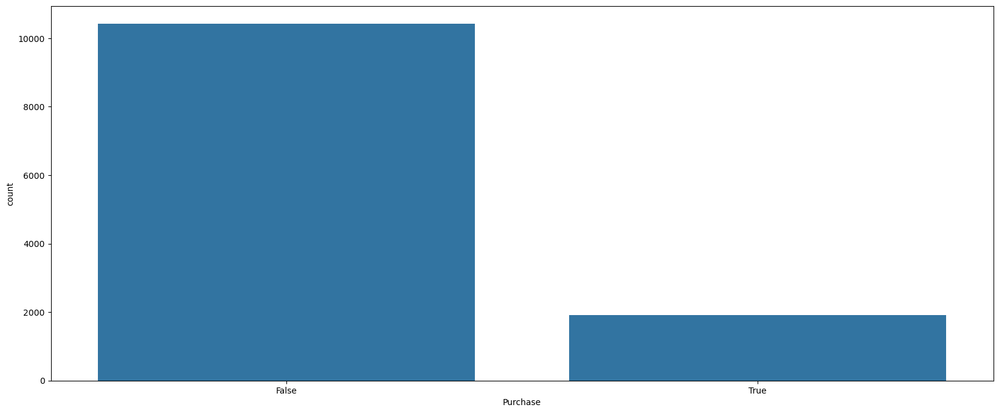

In [47]:
for i in cat_col:
    sns.countplot(x= df[i])
    plt.show()

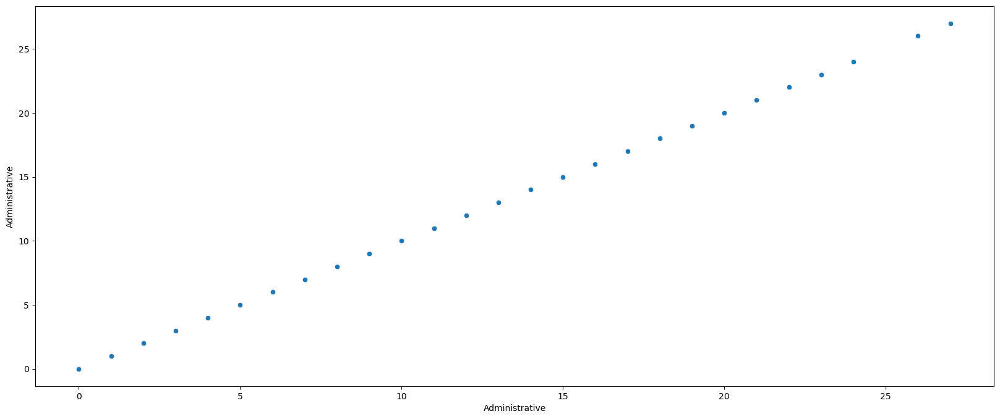

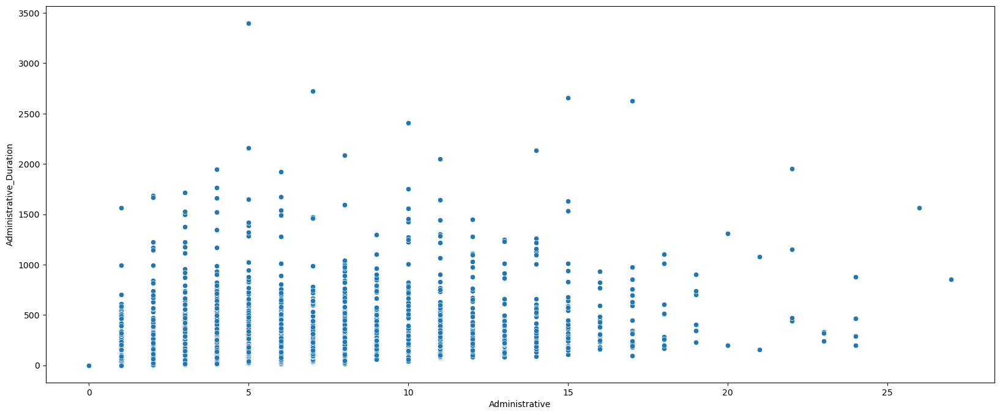

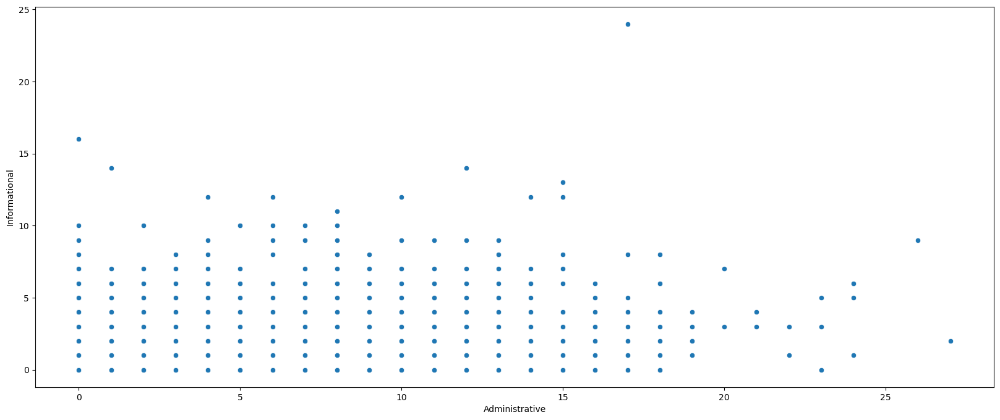

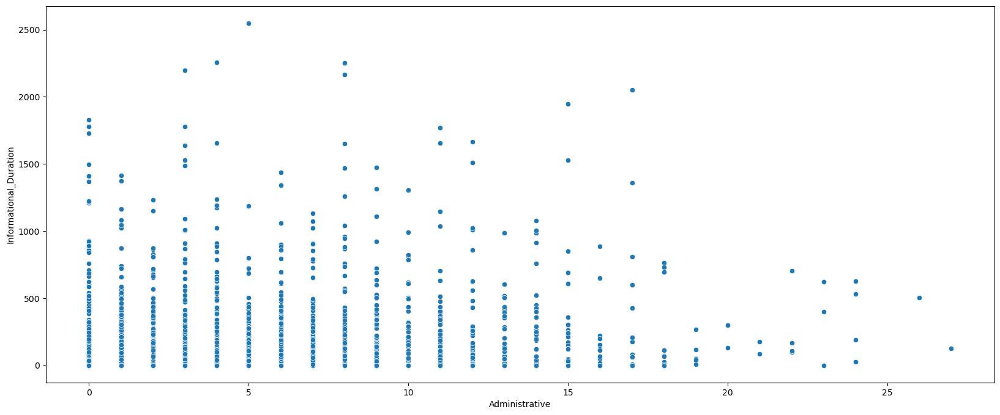

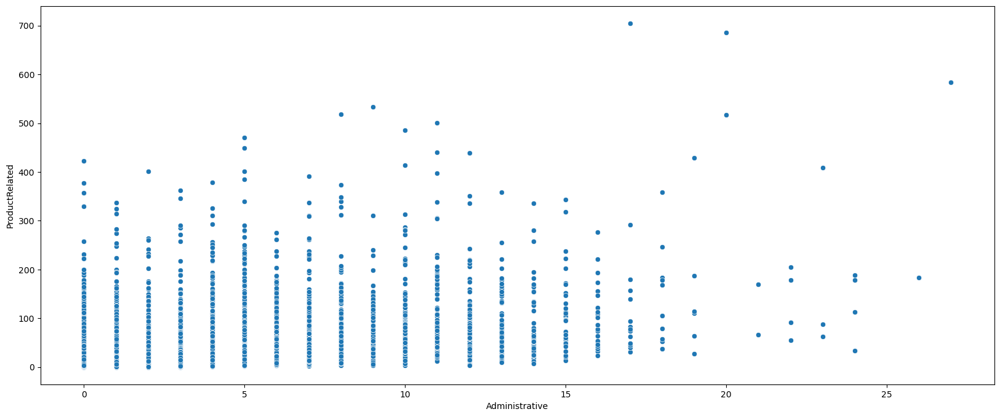

...

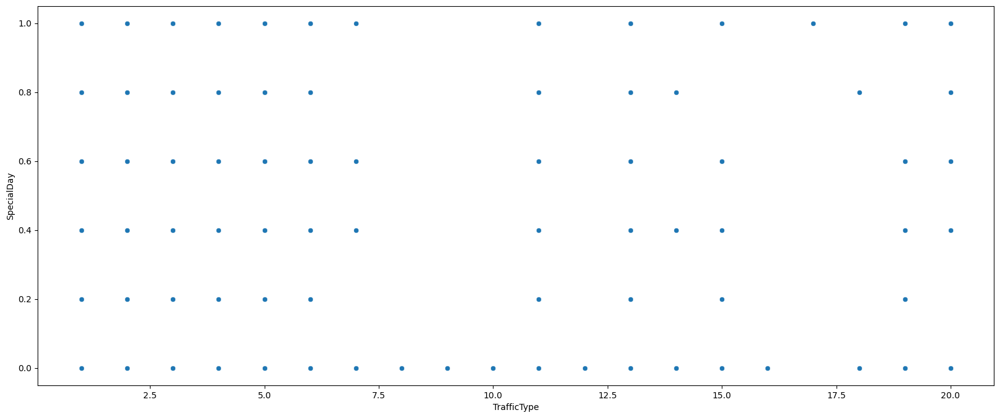

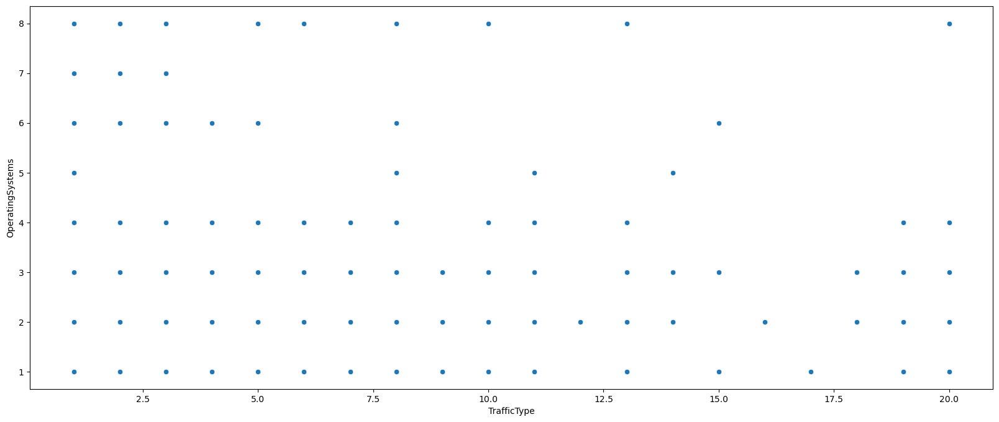

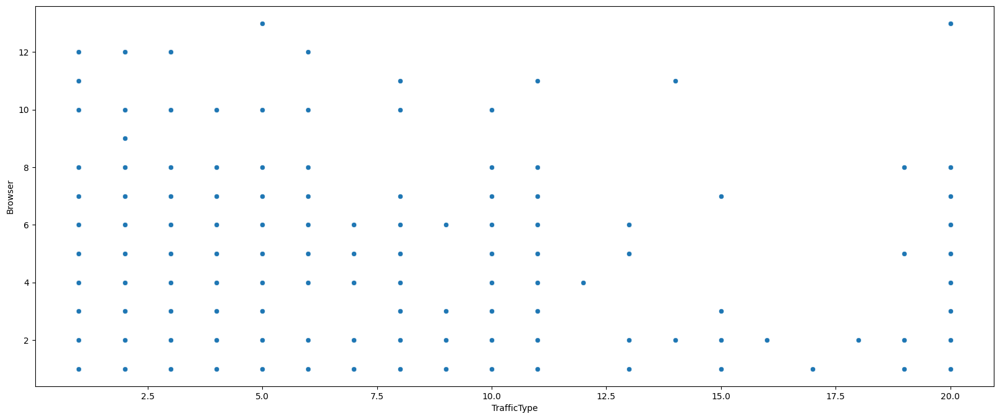

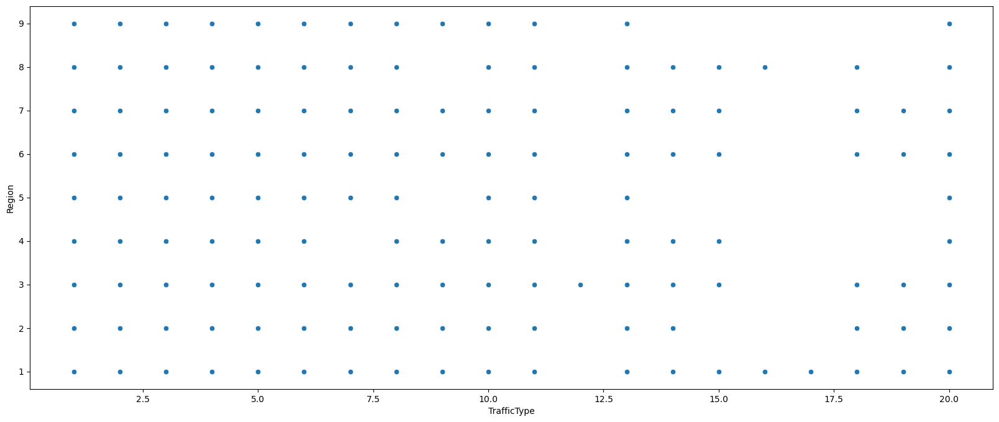

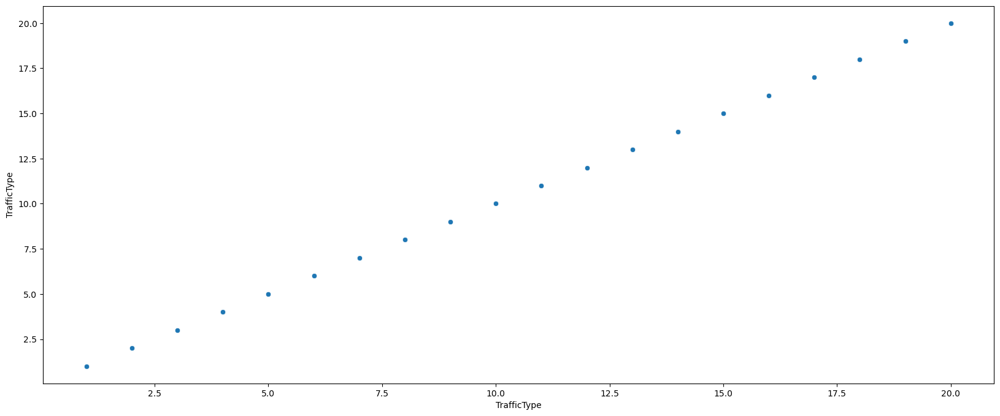

In [48]:
## bi varint

for i in num_col:
    for j in num_col:
        sns.scatterplot(x=df[i],y=df[j])
        plt.show()

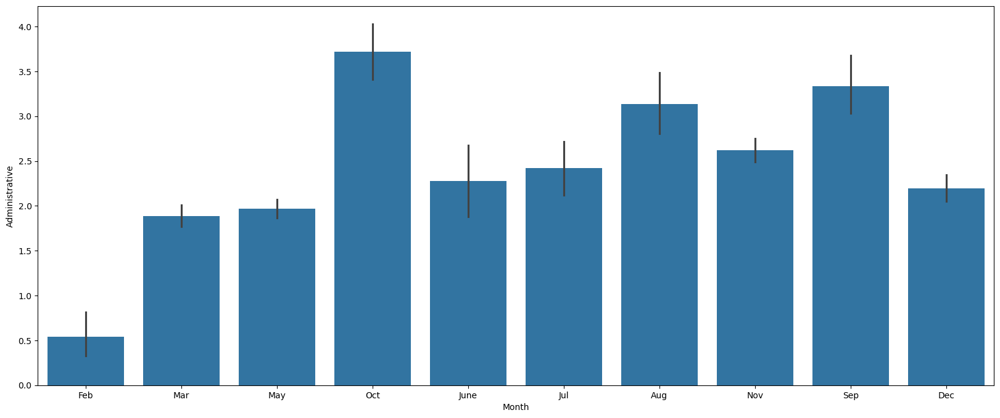

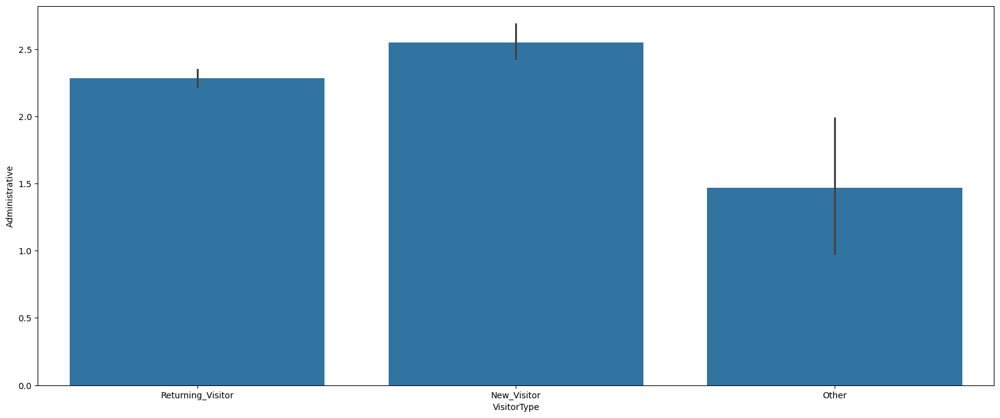

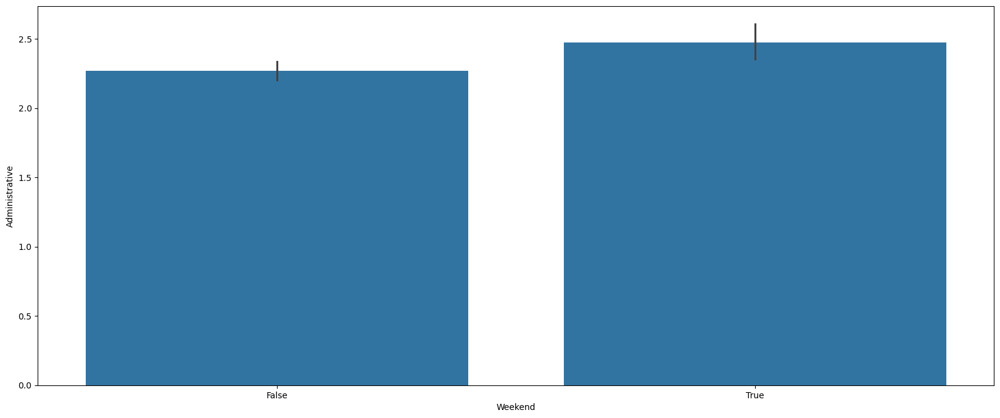

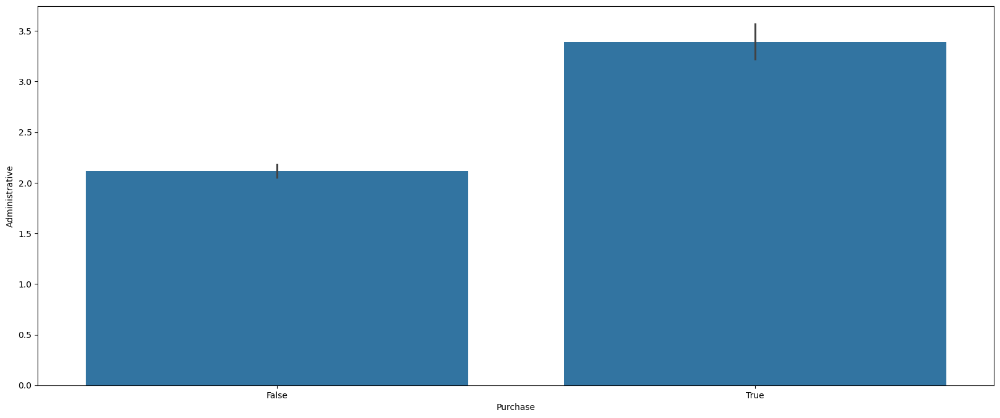

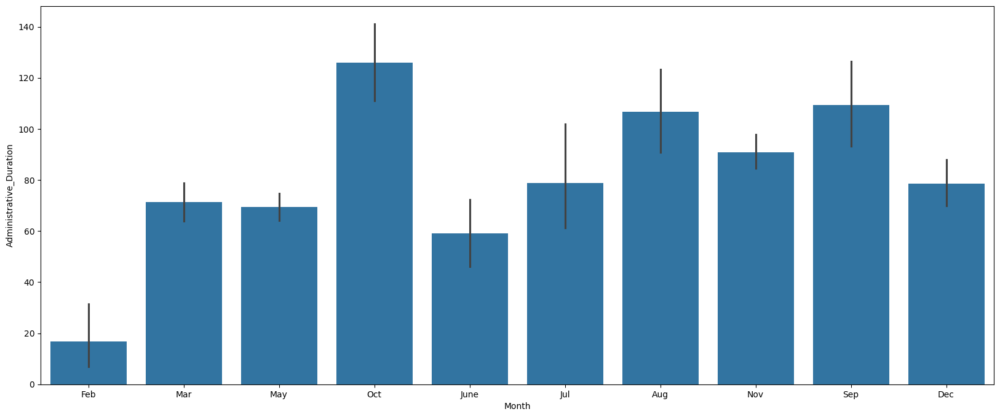

...

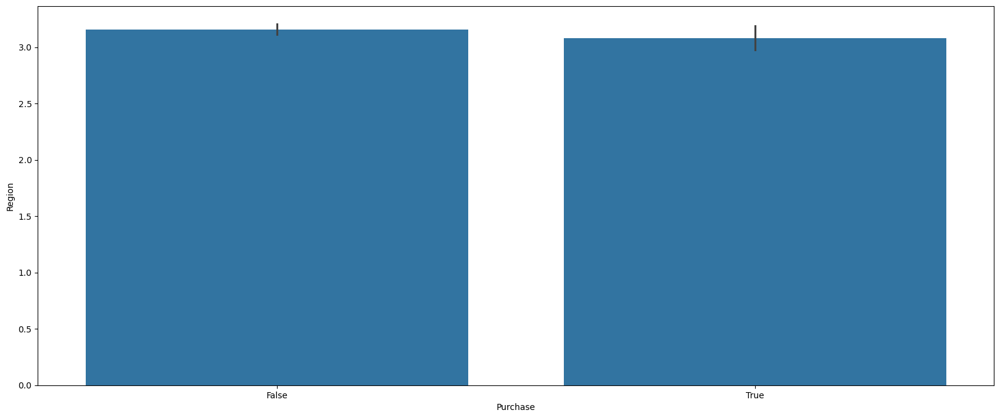

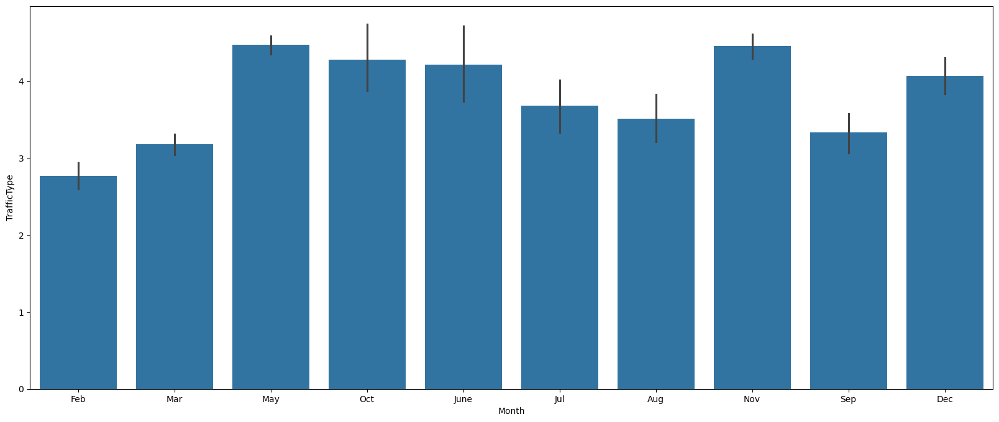

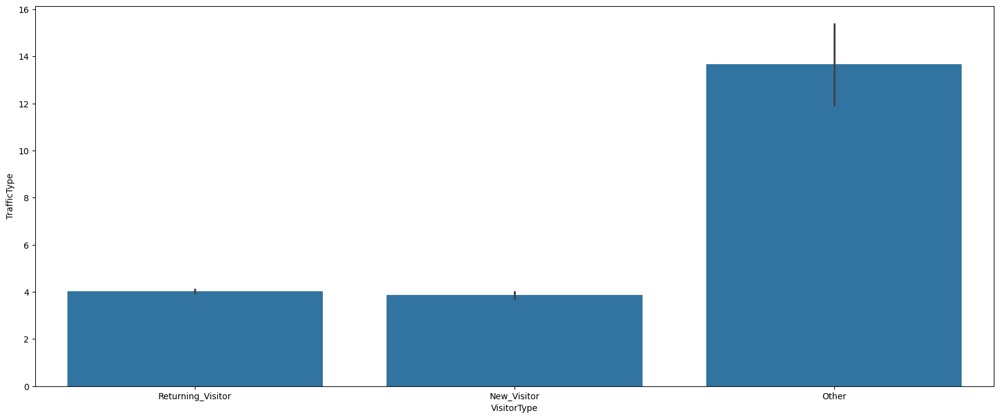

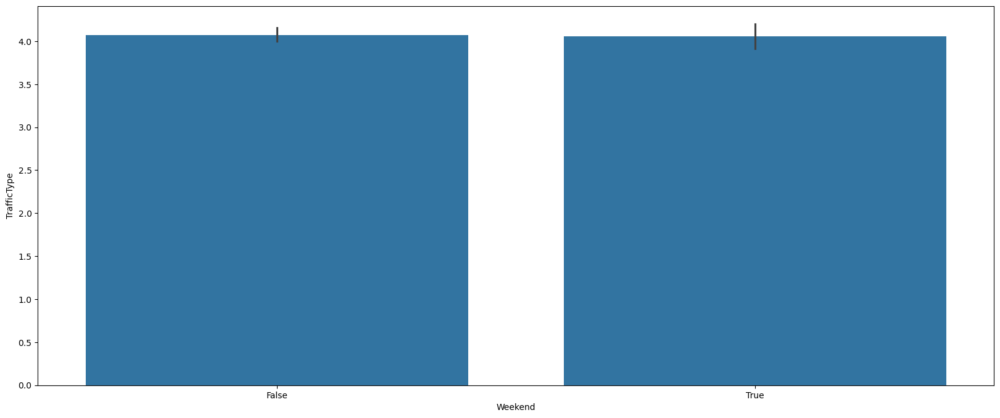

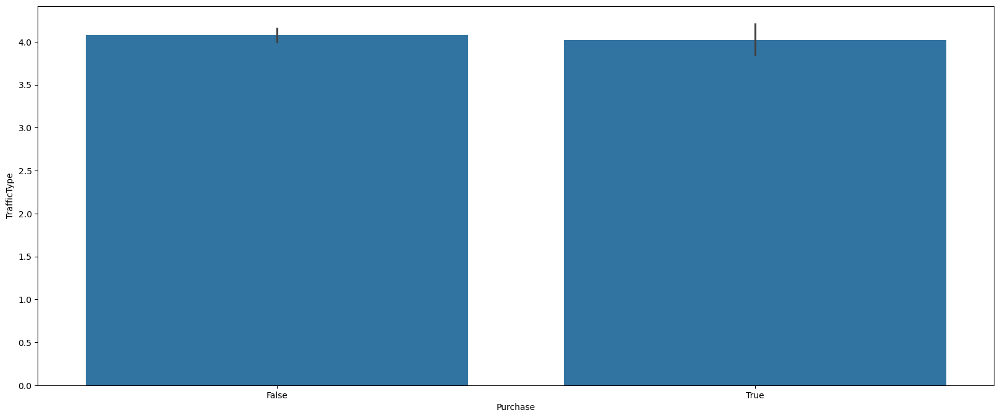

In [49]:
## num vs cat 

for i in num_col:
    for j in cat_col:
        sns.barplot(y= df[i],x=df[j])
        plt.show()

In [50]:
plt.rcParams['figure.figsize'] =[20,8]

In [51]:
c=df[num_col].corr()

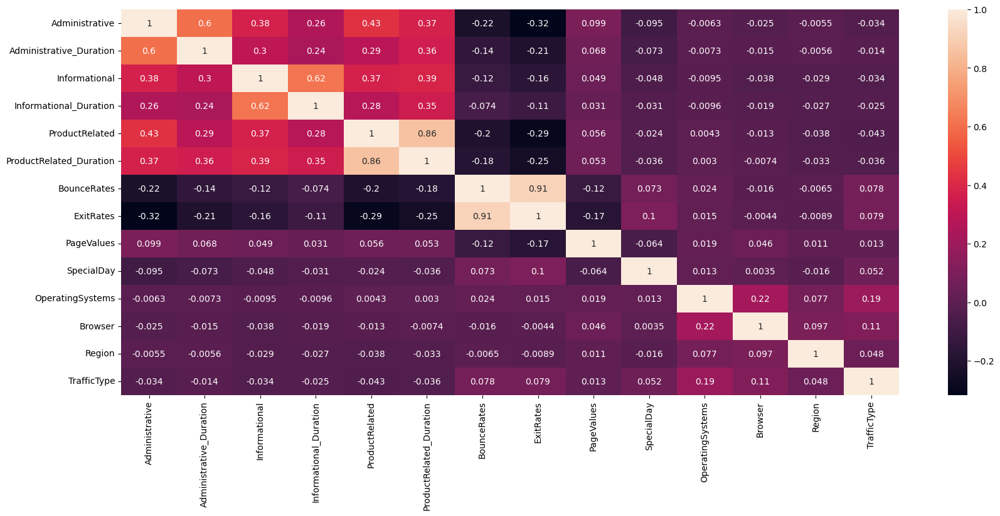

In [52]:
## multivarinat 

sns.heatmap(data= c,annot =  True)
plt.show()

In [53]:
df[num_col].skew()

Administrative             1.960357
Administrative_Duration    5.615719
Informational              4.036464
Informational_Duration     7.579185
ProductRelated             4.341516
ProductRelated_Duration    7.263228
BounceRates                2.947855
ExitRates                  2.148789
PageValues                 6.382964
SpecialDay                 3.302667
OperatingSystems           2.066285
Browser                    3.242350
Region                     0.983549
TrafficType                1.962987
dtype: float64

In [54]:
df[cat_col].value_counts()

Month  VisitorType        Weekend  Purchase
May    Returning_Visitor  False    False       2214
Nov    Returning_Visitor  False    False       1439
Mar    Returning_Visitor  False    False       1182
Dec    Returning_Visitor  False    False        937
May    Returning_Visitor  True     False        554
                                               ... 
Feb    Returning_Visitor  False    True           2
Dec    Other              True     True           1
June   Other              False    False          1
Feb    New_Visitor        False    False          1
       Returning_Visitor  True     True           1
Name: count, Length: 84, dtype: int64

In [55]:
## Check for the outliers

q1= df[num_col].quantile(0.25)
q3= df[num_col].quantile(0.75)

iqr = q3-q1
iqr

uw = q3 +(3.5 * iqr)
lw=  q1 -(3.5 * iqr)

filtered_df =df[(df[num_col]>=lw ) & (df[num_col]<=uw)]


In [56]:
num_col

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType']

In [57]:
PT= PowerTransformer()
df[num_col]=PT.fit_transform(df[num_col])

In [58]:
## Encoding
cat_col

['Month', 'VisitorType', 'Weekend', 'Purchase']

In [59]:
cat= ['Month', 'VisitorType', 'Weekend']

In [60]:
df=pd.get_dummies(data = df,columns= cat,dtype= int ,drop_first= True)

In [61]:
df.head(2)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
0,-0.990128,-0.996659,-0.520489,-0.491697,-1.922123,-2.096783,2.206432,1.982547,-0.529409,-0.33602,...,0,0,0,0,0,0,0,0,1,0
1,-0.990128,-0.996659,-0.520489,-0.491697,-1.574524,-1.074189,-0.799209,1.569866,-0.529409,-0.33602,...,0,0,0,0,0,0,0,0,1,0


In [62]:
df['Purchase']=df['Purchase'].replace({"True":1,"False": 0})

In [63]:
df.head(2)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
0,-0.990128,-0.996659,-0.520489,-0.491697,-1.922123,-2.096783,2.206432,1.982547,-0.529409,-0.33602,...,0,0,0,0,0,0,0,0,1,0
1,-0.990128,-0.996659,-0.520489,-0.491697,-1.574524,-1.074189,-0.799209,1.569866,-0.529409,-0.33602,...,0,0,0,0,0,0,0,0,1,0


In [64]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Purchase',
       'Month_Dec', 'Month_Feb', 'Month_Jul', 'Month_June', 'Month_Mar',
       'Month_May', 'Month_Nov', 'Month_Oct', 'Month_Sep', 'VisitorType_Other',
       'VisitorType_Returning_Visitor', 'Weekend_True'],
      dtype='object')

## Transformation 
since its highly skwed , we perform transformation

In [65]:
df[num_col]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
0,-0.990128,-0.996659,-0.520489,-0.491697,-1.922123,-2.096783,2.206432,1.982547,-0.529409,-0.33602,-1.594583,-1.630444,-1.116671,-1.458641
1,-0.990128,-0.996659,-0.520489,-0.491697,-1.574524,-1.074189,-0.799209,1.569866,-0.529409,-0.33602,0.023949,0.100778,-1.116671,-0.386728
2,-0.990128,-0.996659,-0.520489,-0.491697,-1.922123,-2.096783,2.206432,1.982547,-0.529409,-0.33602,1.816290,-1.630444,1.658089,0.199041
3,-0.990128,-0.996659,-0.520489,-0.491697,-1.574524,-1.875436,1.709303,1.832073,-0.529409,-0.33602,1.065020,0.100778,-0.199574,0.574105
4,-0.990128,-0.996659,-0.520489,-0.491697,-0.442610,0.057515,0.756734,0.722460,-0.529409,-0.33602,1.065020,0.918635,-1.116671,0.574105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,0.848665,1.126581,-0.520489,-0.491697,0.981805,0.811465,-0.106534,-0.009450,1.930441,-0.33602,1.816290,1.904352,-1.116671,-1.458641
12326,-0.990128,-0.996659,-0.520489,-0.491697,-0.974115,-0.126425,-0.799209,-0.374701,-0.529409,-0.33602,1.065020,0.100778,-1.116671,1.308675
12327,-0.990128,-0.996659,-0.520489,-0.491697,-0.839519,-0.623972,2.051336,1.422627,-0.529409,-0.33602,1.065020,0.100778,-1.116671,1.683081
12328,1.040186,0.907532,-0.520489,-0.491697,-0.111001,-0.297654,-0.799209,-0.389234,-0.529409,-0.33602,0.023949,0.100778,0.348789,1.566245


In [66]:
## split  the train and test 

x= df.drop('Purchase',axis = 1)
y= df[['Purchase']]

xtrain,xtest ,ytrain,ytest = train_test_split(x,y,test_size=0.3,random_state=100)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(8631, 26)
(3699, 26)
(8631, 1)
(3699, 1)


In [67]:
# stats test to find whether train and test represent the overall data

In [68]:
# Ho : Both train and test data represent overall data 
# Ha : Not represent overall data 

In [69]:
## statistical analysis

def ttest_ind(train,test, feature):
    stat,pval= stats.ttest_ind(train[feature],test[feature])
    return pval

In [70]:
for i in xtrain.columns:
    pval = ttest_ind(xtrain,xtest,i)
    print(i,pval)

Administrative 0.6598725571248223
Administrative_Duration 0.6248482091737999
Informational 0.03310089478033042
Informational_Duration 0.02011717546444878
ProductRelated 0.9177278466447475
ProductRelated_Duration 0.7487904411213224
BounceRates 0.40202654798956083
ExitRates 0.4028446918683607
PageValues 0.12067487949430583
SpecialDay 0.4577230760171723
OperatingSystems 0.7754867246327181
Browser 0.8293322949101811
Region 0.38412503370555384
TrafficType 0.5870847015444272
Month_Dec 0.04813406906564107
Month_Feb 0.6499745420905905
Month_Jul 0.4290399117996968
Month_June 0.33566336240323447
Month_Mar 0.553609539344003
Month_May 0.13133659803641268
Month_Nov 0.8046342532368953
Month_Oct 0.8713397048818616
Month_Sep 0.7053943596378931
VisitorType_Other 0.5526990057731407
VisitorType_Returning_Visitor 0.1570925829375304
Weekend_True 0.7237306579493993


In [71]:
pval>0.5

True

since all the value pvalue >0.5 , hence we fail to reject the null hypothesis

In [72]:
# Scaling 

In [73]:
num_col

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType']

In [74]:
# Initialize the scaler
S = StandardScaler()

# Fit and transform the training data
xtrain_s = xtrain.copy()
xtrain_s[num_col] = S.fit_transform(xtrain[num_col])

# Transform the test data
xtest_s = xtest.copy()
xtest_s[num_col] = S.transform(xtest[num_col])

print("Scaled Training Data:")
print(xtrain_s)
print("\nScaled Test Data:")
print(xtest_s)

Scaled Training Data:
       Administrative  Administrative_Duration  Informational  \
4750         0.094305                 1.055987      -0.528262   
5707         1.453066                 1.190723       1.794206   
9087        -0.987245                -0.992965      -0.528262   
7229         1.380441                 0.650798      -0.528262   
6869         1.567086                 1.785239       1.794206   
...               ...                      ...            ...   
79          -0.987245                -0.992965      -0.528262   
12119       -0.987245                -0.992965      -0.528262   
8039        -0.987245                -0.992965      -0.528262   
6936         1.721678                 0.964723       1.969959   
5640         0.851011                 0.823071      -0.528262   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
4750                -0.500019        0.211719                 0.533096   
5707                 2.042920        0.130471    

In [75]:
xtrain_s

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
4750,0.094305,1.055987,-0.528262,-0.500019,0.211719,0.533096,0.015961,0.045725,1.950296,-0.338428,...,0,0,0,1,0,0,0,0,1,1
5707,1.453066,1.190723,1.794206,2.042920,0.130471,0.083662,-0.799409,-1.094762,1.937226,-0.338428,...,0,0,0,0,1,0,0,0,1,0
9087,-0.987245,-0.992965,-0.528262,-0.500019,-0.619601,0.133871,0.297157,0.244526,-0.535475,-0.338428,...,0,0,0,0,1,0,0,0,1,0
7229,1.380441,0.650798,-0.528262,-0.500019,0.387878,-0.298007,-0.799409,0.255729,-0.535475,-0.338428,...,1,0,0,0,0,0,0,0,1,0
6869,1.567086,1.785239,1.794206,2.038050,0.355261,0.646715,0.713790,-0.158114,1.897729,-0.338428,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,-0.987245,-0.992965,-0.528262,-0.500019,-1.921944,-2.093095,2.188513,1.974109,-0.535475,2.962139,...,0,0,0,0,0,0,0,0,1,0
12119,-0.987245,-0.992965,-0.528262,-0.500019,-0.168826,-0.711949,1.804126,0.898287,-0.535475,-0.338428,...,0,0,0,0,0,0,0,0,1,0
8039,-0.987245,-0.992965,-0.528262,-0.500019,0.638594,1.815823,-0.799409,-1.341839,-0.535475,-0.338428,...,0,0,0,0,1,0,0,0,1,0
6936,1.721678,0.964723,1.969959,2.046963,2.028378,1.607005,-0.431635,-0.520273,1.906718,-0.338428,...,1,0,0,0,0,0,0,0,1,0


In [76]:
xtest_s

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
2520,-0.987245,-0.992965,-0.528262,-0.500019,-1.921944,-2.093095,2.188513,1.974109,-0.535475,-0.338428,...,0,0,0,1,0,0,0,0,1,0
2412,-0.987245,-0.992965,-0.528262,-0.500019,-0.295542,-0.083032,-0.799409,-0.547156,1.965621,-0.338428,...,0,0,0,1,0,0,0,0,0,1
762,-0.987245,-0.992965,-0.528262,-0.500019,-0.057713,-0.058261,0.297157,0.409214,-0.535475,-0.338428,...,0,0,1,0,0,0,0,0,1,0
5916,1.653414,1.293876,1.967234,2.052703,2.924510,3.557896,-0.430366,-0.882082,1.904673,-0.338428,...,0,0,0,0,0,0,1,0,1,0
10524,-0.987245,-0.992965,-0.528262,-0.500019,0.419372,0.308760,-0.799409,-0.111891,-0.535475,-0.338428,...,0,0,0,0,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11809,-0.987245,-0.992965,-0.528262,-0.500019,-1.132949,-0.369970,-0.799409,0.409214,1.960049,-0.338428,...,0,0,0,0,0,0,0,1,0,0
6545,1.183372,1.450043,-0.528262,-0.500019,1.680360,1.631698,-0.365428,-0.292862,1.916482,-0.338428,...,0,0,0,0,0,0,0,0,1,1
10724,-0.987245,-0.992965,-0.528262,-0.500019,0.211719,0.741522,0.047072,-0.197527,-0.535475,-0.338428,...,0,0,0,0,0,0,0,0,0,1
1448,1.453066,1.201955,1.971167,2.048732,0.613889,0.606898,-0.633832,-0.548974,1.921570,-0.338428,...,0,0,1,0,0,0,0,0,1,0


In [77]:
# Model bulding 

In [78]:
def metrics(name,key,args):
    print("Name of the model",name)
    print("Accuracy of the model",accuracy_score(key,args))
    print("Precision of the model",precision_score(key,args))
    print('Recall of the model',recall_score(key,args))
    print('Classification Report',classification_report(key,args))
    print('Confusion Matrix',confusion_matrix(key,args))

## check for the multi collineratity

In [80]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF

In [81]:
vf  = [VIF (xtrain_s.values,i)for i in range (xtrain_s.shape[1])]
vf_df= pd.DataFrame(vf,index = xtrain_s.columns,columns=['VIF'])
vf_df

,VIF
Administrative,12.021785
Administrative_Duration,11.853474
Informational,10.348652
Informational_Duration,10.305905
ProductRelated,6.406387
ProductRelated_Duration,5.642515
BounceRates,2.356336
ExitRates,3.528967
PageValues,1.222626
SpecialDay,1.444956


Since the VIF value is lessthan 10 expect the administrative ,will proceed for further analysis.



## Model Building 

## LogisticRegression

In [84]:
LR= LogisticRegression()
LR.fit(xtrain_s,ytrain)

LogisticRegression()

In [85]:
LRy_pred=LR.predict(xtest_s)

In [86]:
metrics(LogisticRegression , ytest,LRy_pred)

Name of the model <class 'sklearn.linear_model._logistic.LogisticRegression'>
Accuracy of the model 0.8994322789943228
Precision of the model 0.6799163179916318
Recall of the model 0.5974264705882353
Classification Report               precision    recall  f1-score   support

       False       0.93      0.95      0.94      3155
        True       0.68      0.60      0.64       544

    accuracy                           0.90      3699
   macro avg       0.81      0.77      0.79      3699
weighted avg       0.89      0.90      0.90      3699

Confusion Matrix [[3002  153]
 [ 219  325]]


In [87]:
y_soft = LR.predict_proba(xtest_s)[:,1]

In [88]:
a1= accuracy_score(ytest,LRy_pred)

In [89]:
f1= f1_score(ytest,LRy_pred)

In [90]:
def curve(key,arg):
    fpr,tpr,threshold = roc_curve(key,arg)
    plt.plot(fpr,tpr)
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([0.0 ,1.0])
    plt.ylim([0.0 , 1.0])
    print('Area under the curve:',roc_auc_score(key,arg))

Area under the curve: 0.9093345063857556


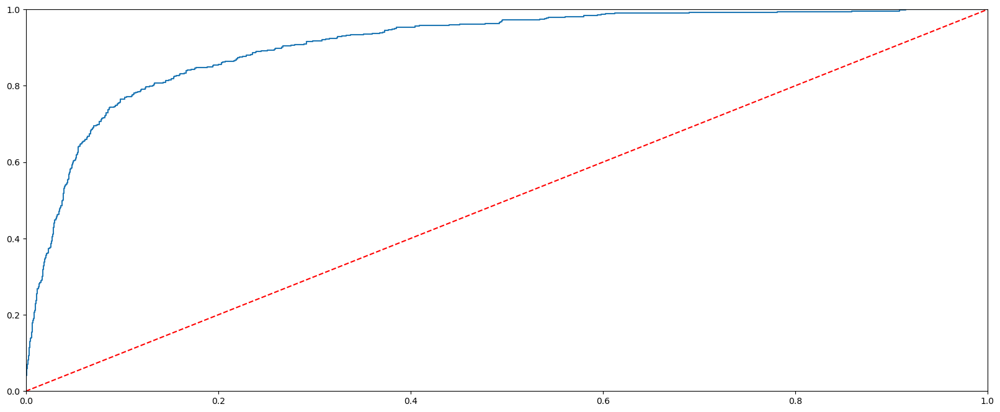

In [91]:
curve(ytest,y_soft)

## DecisionTreeClassifier

In [92]:
# model 2

DT= DecisionTreeClassifier()
DT.fit(xtrain_s,ytrain)

DecisionTreeClassifier()

In [93]:
DT_pred= DT.predict(xtest_s)

In [94]:
a2=accuracy_score(ytest,DT_pred)

In [95]:
f2=f1_score(ytest,DT_pred)

In [96]:
metrics(DecisionTreeClassifier,ytest,DT_pred)

Name of the model <class 'sklearn.tree._classes.DecisionTreeClassifier'>
Accuracy of the model 0.8605028386050284
Precision of the model 0.5241379310344828
Recall of the model 0.5588235294117647
Classification Report               precision    recall  f1-score   support

       False       0.92      0.91      0.92      3155
        True       0.52      0.56      0.54       544

    accuracy                           0.86      3699
   macro avg       0.72      0.74      0.73      3699
weighted avg       0.86      0.86      0.86      3699

Confusion Matrix [[2879  276]
 [ 240  304]]


In [97]:
DT_soft= DT.predict_proba(xtest_s)[:,1]

Area under the curve: 0.7356716696187191


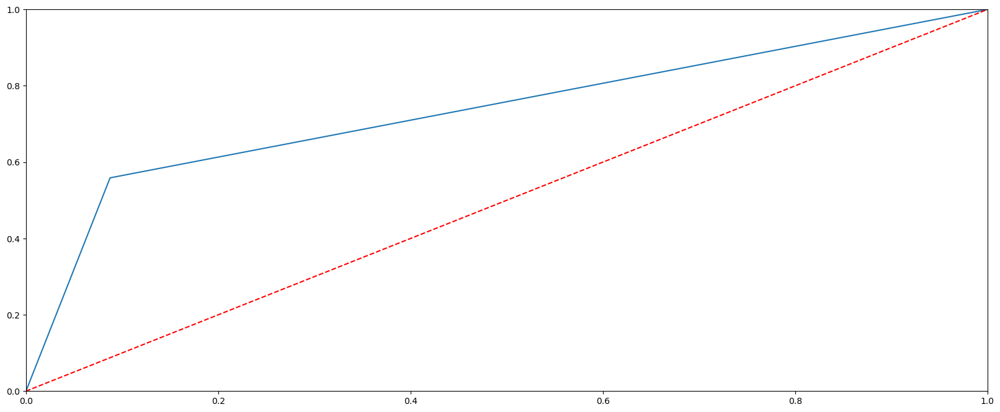

In [98]:
curve(ytest,DT_soft)

## RandomForestClassifier

In [99]:
# model 3

RF = RandomForestClassifier()
RF.fit(xtrain_s,ytrain)

RandomForestClassifier()

In [100]:
RT_pred = RF.predict(xtest_s)

In [101]:
a3=accuracy_score(ytest,RT_pred)

In [102]:
f3= f1_score(ytest,RT_pred)

In [103]:
metrics (RandomForestClassifier,ytest,DT_pred)

Name of the model <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Accuracy of the model 0.8605028386050284
Precision of the model 0.5241379310344828
Recall of the model 0.5588235294117647
Classification Report               precision    recall  f1-score   support

       False       0.92      0.91      0.92      3155
        True       0.52      0.56      0.54       544

    accuracy                           0.86      3699
   macro avg       0.72      0.74      0.73      3699
weighted avg       0.86      0.86      0.86      3699

Confusion Matrix [[2879  276]
 [ 240  304]]


In [104]:
DT_soft= DT.predict_proba(xtest)[:,1]

Area under the curve: 0.7411543301948356


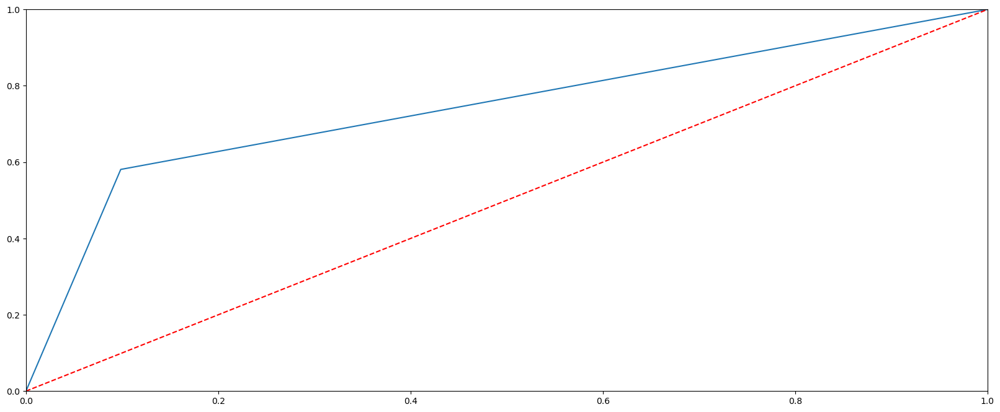

In [105]:
curve(ytest,DT_soft)

## GradientBoostingClassifier

In [106]:
# model 4 

GB = GradientBoostingClassifier()
GB.fit(xtrain_s,ytrain)


GradientBoostingClassifier()

In [107]:
GB_pred= GB.predict(xtest_s)

In [108]:
a4= accuracy_score(ytest,GB_pred)

In [109]:
f4=f1_score(ytest,GB_pred,average='weighted')
f4

0.8994822230482666

In [110]:
metrics(GradientBoostingClassifier,ytest,GB_pred)

Name of the model <class 'sklearn.ensemble._gb.GradientBoostingClassifier'>
Accuracy of the model 0.9021357123546905
Precision of the model 0.6903765690376569
Recall of the model 0.6066176470588235
Classification Report               precision    recall  f1-score   support

       False       0.93      0.95      0.94      3155
        True       0.69      0.61      0.65       544

    accuracy                           0.90      3699
   macro avg       0.81      0.78      0.79      3699
weighted avg       0.90      0.90      0.90      3699

Confusion Matrix [[3007  148]
 [ 214  330]]


In [111]:
GB_hard= GB.predict_proba(xtest_s)[:,1]

Area under the curve: 0.9237921832758459


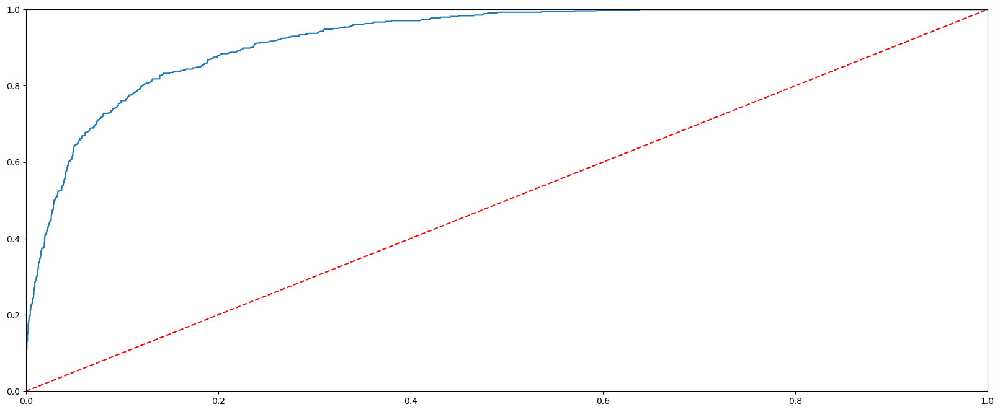

In [112]:
curve(ytest,GB_hard)

## AdaBoostClassifier

In [113]:
#Model5 

ADA = AdaBoostClassifier()
ADA.fit(xtrain_s,ytrain)

AdaBoostClassifier()

In [114]:
ADA_pred= ADA.predict(xtest_s)
ADA_SOFT= ADA.predict_proba(xtest_s)[:,1]

In [115]:
a5=accuracy_score(ytest,ADA_pred)

In [116]:
f5=f1_score(ytest,ADA_pred)

In [117]:
metrics(AdaBoostClassifier,ytest,ADA_pred)

Name of the model <class 'sklearn.ensemble._weight_boosting.AdaBoostClassifier'>
Accuracy of the model 0.8886185455528521
Precision of the model 0.6441048034934498
Recall of the model 0.5422794117647058
Classification Report               precision    recall  f1-score   support

       False       0.92      0.95      0.94      3155
        True       0.64      0.54      0.59       544

    accuracy                           0.89      3699
   macro avg       0.78      0.75      0.76      3699
weighted avg       0.88      0.89      0.88      3699

Confusion Matrix [[2992  163]
 [ 249  295]]


Area under the curve: 0.9112720821292066


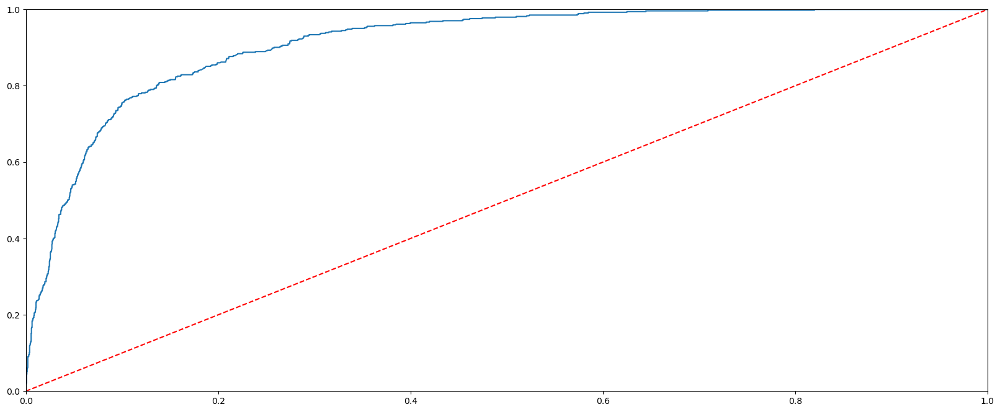

In [118]:
curve(ytest,ADA_SOFT)

## XGBClassifier

In [119]:
# model 6
from xgboost import XGBClassifier

In [120]:
xg= XGBClassifier()
xg.fit(xtrain_s,ytrain)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [121]:
xg_pred = xg.predict(xtest_s)
xg_soft= xg.predict_proba(xtest_s)[:,1]

In [122]:
a6=accuracy_score(ytest,xg_pred)

In [123]:
f6=f1_score(ytest,xg_pred)

In [124]:
metrics(XGBClassifier,ytest,xg_pred)

Name of the model <class 'xgboost.sklearn.XGBClassifier'>
Accuracy of the model 0.891051635577183
Precision of the model 0.656319290465632
Recall of the model 0.5441176470588235
Classification Report               precision    recall  f1-score   support

       False       0.92      0.95      0.94      3155
        True       0.66      0.54      0.59       544

    accuracy                           0.89      3699
   macro avg       0.79      0.75      0.77      3699
weighted avg       0.88      0.89      0.89      3699

Confusion Matrix [[3000  155]
 [ 248  296]]


Area under the curve: 0.9170443157453155


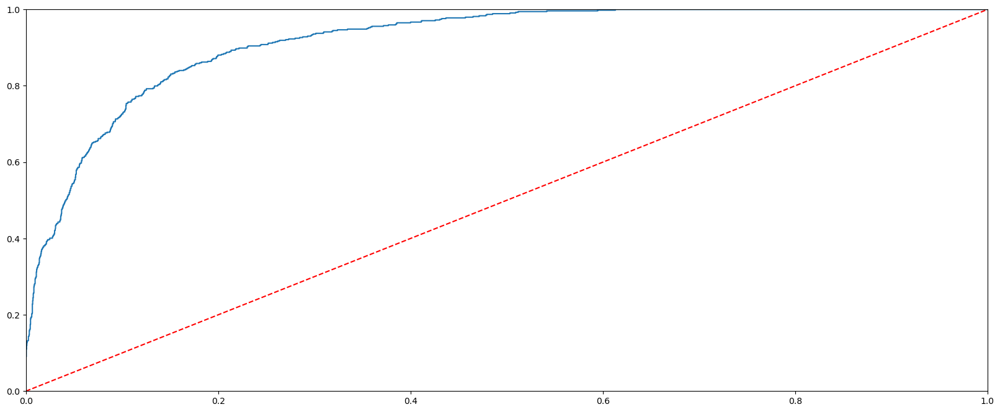

In [125]:
curve(ytest,xg_soft)

## Hyparameter Tuning using Gridsearch CV

In [126]:
# model 8  hypermater tuniing 

params = {'n_estimators':[200,300],
          'max_depth':[5,7]}

In [127]:
gscv= GridSearchCV(GradientBoostingClassifier(random_state=50),param_grid=params,cv= 3,scoring= 'roc_auc')

In [128]:
gscv.fit(xtrain_s,ytrain)

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=50),
             param_grid={'max_depth': [5, 7], 'n_estimators': [200, 300]},
             scoring='roc_auc')

In [129]:
gscv.best_params_

{'max_depth': 5, 'n_estimators': 200}

In [130]:
gscv.best_score_

0.9311008544510734

In [131]:
y_pred=gscv.predict(xtest_s)

In [132]:
gscv.predict_proba(xtest_s)[:,1]

array([0.00148943, 0.98611471, 0.00362246, ..., 0.01858392, 0.28495108,
       0.01143822])

In [133]:
metrics(gscv ,ytest,y_pred)

Name of the model GridSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=50),
             param_grid={'max_depth': [5, 7], 'n_estimators': [200, 300]},
             scoring='roc_auc')
Accuracy of the model 0.8942957556096243
Precision of the model 0.6597077244258872
Recall of the model 0.5808823529411765
Classification Report               precision    recall  f1-score   support

       False       0.93      0.95      0.94      3155
        True       0.66      0.58      0.62       544

    accuracy                           0.89      3699
   macro avg       0.79      0.76      0.78      3699
weighted avg       0.89      0.89      0.89      3699

Confusion Matrix [[2992  163]
 [ 228  316]]


In [134]:
def metrics(name,key,args ):
    print("Name of the model",name)
    print(" Accuracy",accuracy_score(key,args))
    print("Precision",precision_score(key,args))
    print("Recall",recall_score(key,args))
    print("F1 score'",f1_score(key,args))
    print("Classification Report",classification_report(key,args))

In [135]:
data = {"model":['LogisticRegression','DecisionTreeClassifier', 'RandomForestClassifier',"GradientBoostingClassifier","AdaBoostClassifier","XGBClassifier"],
        "Accuracy":[a1,a2,a3,a4,a5,a6],
        "F1 score":[f1,f2,f3,f4,f5,f6]}

In [136]:
result = pd.DataFrame(data).sort_values(by=['Accuracy','F1 score'],ascending= False)
result

,model,Accuracy,F1 score
3,GradientBoostingClassifier,0.902136,0.899482
2,RandomForestClassifier,0.901325,0.627171
0,LogisticRegression,0.899432,0.636008
5,XGBClassifier,0.891052,0.594975
4,AdaBoostClassifier,0.888619,0.588822
1,DecisionTreeClassifier,0.860503,0.540925


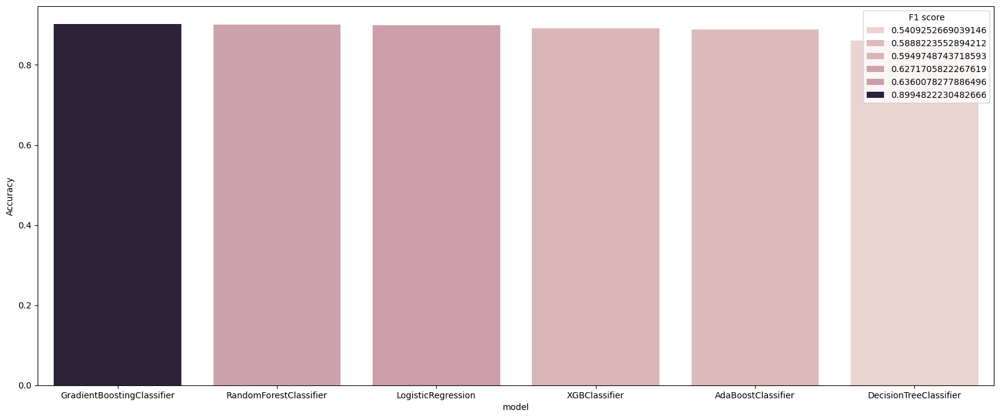

In [141]:
sns.barplot(y=result['Accuracy'],hue=result['F1 score'],x=result['model'])
plt.show()

Inferences: 

Among all the  models , Gradient Boosting Classifier provides higher accuracy and higher f1 score .In conclusion, achieving an accuracy of 90.4% and  F1-

score of 90% is a promising result, but further analysis, model evaluation, and business context are essential to draw comprehensive conclusions and 

make informed decisions.